## Spatial tissue niche discovery (single-modality spatial data)

Here we will use slideseqv2_mouse_hippocampus datasets as an example to illustrate how Garfield performs spatial tissue niche discovery for multiple batches. Data access: https://singlecell.broadinstitute.org/single_cell/study/SCP815/highly-sensitive-spatial-transcriptomics-at-near-cellular-resolution-with-slide-seqv2.

In [1]:
import os
import pandas as pd
import numpy as np

os.chdir('/data2/zhouwg_data/project/Garfield')
os.getcwd()

'/data2/zhouwg_data/project/Garfield'

In [2]:
# load packages
import os
import warnings
import Garfield as gf
import scanpy as sc

warnings.simplefilter(action="ignore", category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

gf.__version__

/home/zhouweige/anaconda3/envs/env_gf_test/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


'0.3.6'

In [3]:
# Load data
# Define paths
st_data_folder_path = "/home/zhouweige/zhouwg_data/project/Garfield_tutorials/data" # spatially resolved transcriptomics data

dataset = "slideseqv2_mouse_hippocampus"
cell_type_key = "cell_type"

adata = sc.read_h5ad(f"{st_data_folder_path}/{dataset}.h5ad")
adata.var_names_make_unique(join="++")
adata

AnnData object with n_obs × n_vars = 41786 × 4000
    obs: 'cell_type', 'batch'
    obsm: 'spatial'
    layers: 'counts'

In [4]:
# check the celltype information of this dataset
adata.obs['cell_type'].value_counts()

cell_type
CA1_CA2_CA3_Subiculum       7649
DentatePyramids             6606
Astrocytes                  6543
Interneurons                3672
Oligodendrocytes            3602
Subiculum_Entorhinal_cl2    2896
Endothelial_Stalk           1991
Subiculum_Entorhinal_cl3    1985
Polydendrocytes             1449
Endothelial_Tip             1317
Microglia                   1298
Mural                       1027
Neurogenesis                 938
Ependymal                    813
Name: count, dtype: int64

In [5]:
# check the batch information of this dataset
adata.obs['batch'].value_counts()

batch
sample1    41786
Name: count, dtype: int64

In [6]:
# Ensure adata.X is counts.
adata.X = adata.layers['counts'].copy()
adata.X.max()

169.0

## Integrating spatially resolved transcriptomics data using Garfield

For spatial niche discovery from spatially resolved transcriptomics data, we should adjust the following paremeters,
and all parameter introductions can be found in [Garfield_Model_Parameters](https://github.com/zhou-1314/Garfield/blob/main/Garfield_Model_Parameters.md).

In [7]:
# set workdir
workdir = '/home/zhouweige/zhouwg_data/project/Garfield_tutorials/result/garfield_spRNA_mouse_hippocampus' 
gf.settings.set_workdir(workdir)

### modify parameter
user_config = dict(
    ## Input options
    adata_list=adata, 
    profile='spatial',  
    data_type='single-modal',
    sample_col=None,  # only one batch, so set it as `None`
    weight=1.0,

    ## Preprocessing options
    graph_const_method='mu_std', # mu_std, Radius, KNN, Squidpy
    used_hvg=True,
    min_cells=3,
    min_features=0,
    keep_mt=False,
    target_sum=1e4,
    rna_n_top_features=3000,
    n_components=50,
    n_neighbors=5,
    metric='euclidean',  
    svd_solver='arpack',
    # datasets
    used_pca_feat=False,
    adj_key='connectivities',
    
    # data split parameters
    edge_val_ratio=0.1,
    edge_test_ratio=0.,
    node_val_ratio=0.1,
    node_test_ratio=0.,

    ## Model options
    augment_type='svd',
    svd_q=5,
    use_FCencoder=False,
    conv_type='GATv2Conv', # GAT or GATv2Conv or GCN
    gnn_layer=2,
    hidden_dims=[128, 128],
    bottle_neck_neurons=20,
    cluster_num=20,
    drop_feature_rate=0.2, 
    drop_edge_rate=0.2,
    num_heads=3,
    dropout=0.2,
    concat=True,
    used_edge_weight=False,
    used_DSBN=False,
    used_mmd=False,
    # data loader parameters
    num_neighbors=5,
    loaders_n_hops=2,
    edge_batch_size=4096,
    node_batch_size=128, # None
    # loss parameters
    include_edge_recon_loss=True,
    include_gene_expr_recon_loss=True,
    lambda_latent_contrastive_instanceloss=1.0,
    lambda_latent_contrastive_clusterloss=1.0,
    lambda_gene_expr_recon=10.,
    lambda_edge_recon=20.,  # We hope that the model can learn more graph structure information, so we increase this hyperparameters.
    lambda_latent_adj_recon_loss=0.5,
    lambda_omics_recon_mmd_loss=1.0,
    # train parameters
    n_epochs_no_edge_recon=0,
    learning_rate=0.001,
    weight_decay=1e-05,
    gradient_clipping=5,
    # other parameters
    latent_key='garfield_latent',
    reload_best_model=True,
    use_early_stopping=True,
    early_stopping_kwargs=None,
    monitor=True,
    device_id=1,
    seed=2024,
    verbose=True
)
dict_config = gf.settings.set_gf_params(user_config)

Saving results in: /home/zhouweige/zhouwg_data/project/Garfield_tutorials/result/garfield_spRNA_mouse_hippocampus


In [8]:
from Garfield.model import Garfield

# Initialize model
model = Garfield(dict_config)

--- DATA LOADING AND PREPROCESSING ---
------Calculating spatial graph...
COSINE SIM GRAPH DECODER -> dropout_rate: 0.2


In [9]:
# Train model
model.train()


--- INITIALIZING TRAINER ---
Number of training nodes: 37607
Number of validation nodes: 4179
Number of training edges: 106469
Number of validation edges: 11829
Edge batch size: 4096
Node batch size: 128

--- MODEL TRAINING ---
Epoch 1/100 |--------------------| 1.0% val_auroc_score: 0.7552; val_auprc_score: 0.7325; val_best_acc_score: 0.6903; val_best_f1_score: 0.7232; train_kl_reg_loss: 15.5828; train_edge_recon_loss: 22701.0442; train_gene_expr_recon_loss: 61065.8555; train_lambda_latent_adj_recon_loss: 245.8505; train_lambda_latent_contrastive_instanceloss: 7.1755; train_lambda_latent_contrastive_clusterloss: 3.6795; train_global_loss: 84039.1890; train_optim_loss: 84039.1890; val_kl_reg_loss: 30.7380; val_edge_recon_loss: 20336.7331; val_gene_expr_recon_loss: 56448.8867; val_lambda_latent_adj_recon_loss: 276.7298; val_lambda_latent_contrastive_instanceloss: 6.8663; val_lambda_latent_contrastive_clusterloss: 3.6268; val_global_loss: 77103.5781; val_optim_loss: 77103.5781
Epoch 2/1

In [10]:
sc.pp.neighbors(model.adata, use_rep='garfield_latent')
sc.tl.umap(model.adata)

In [11]:
sc.tl.leiden(adata=model.adata, 
             resolution=1.0)
len(model.adata.obs['leiden'].unique())

17

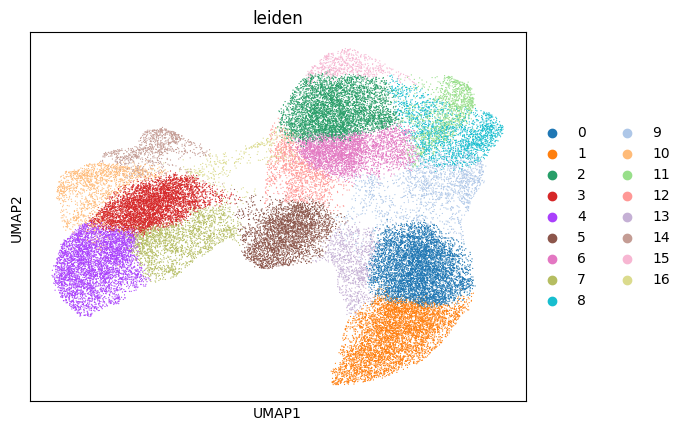

In [12]:
## cell distribution colored by original celltype
sc.pl.umap(model.adata, color=['leiden'], show=True, size=3)

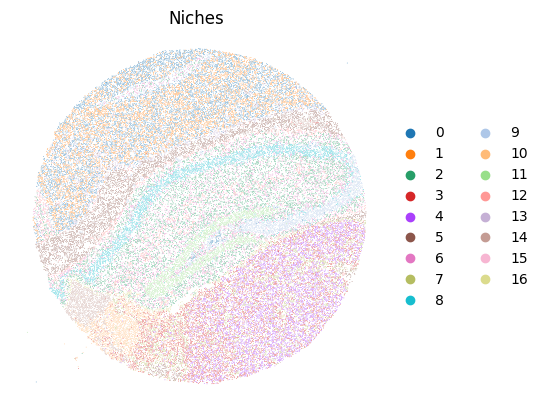

In [13]:
sc.pl.spatial(model.adata, color='leiden', spot_size=10, frameon=False, title='Niches')

## Visualize Garfield Latent Space

In [14]:
# Compute latent neighbor graph
latent_key = 'garfield_latent'
sc.pp.neighbors(model.adata,
                use_rep=latent_key,
                key_added=latent_key)
# Compute UMAP embedding
sc.tl.umap(model.adata,
           neighbors_key=latent_key)

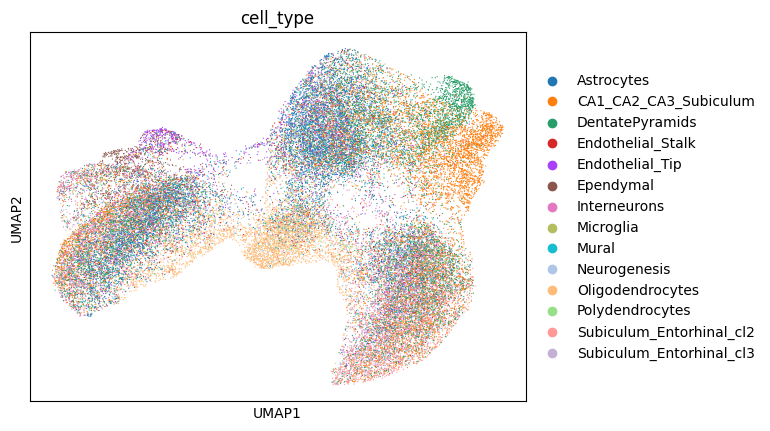

In [15]:
## cell distribution colored by original celltype
sc.pl.umap(model.adata, color=['cell_type'], show=True, size=3)

In [ ]:
# Compute latent Leiden clustering
latent_leiden_resolution = 0.8
latent_cluster_key = f"latent_leiden_{str(latent_leiden_resolution)}"
latent_key = "garfield_latent"

sc.tl.leiden(adata=model.adata,
             resolution=latent_leiden_resolution,
             key_added=latent_cluster_key,
             neighbors_key=latent_key)
len(model.adata.obs[latent_cluster_key].unique())

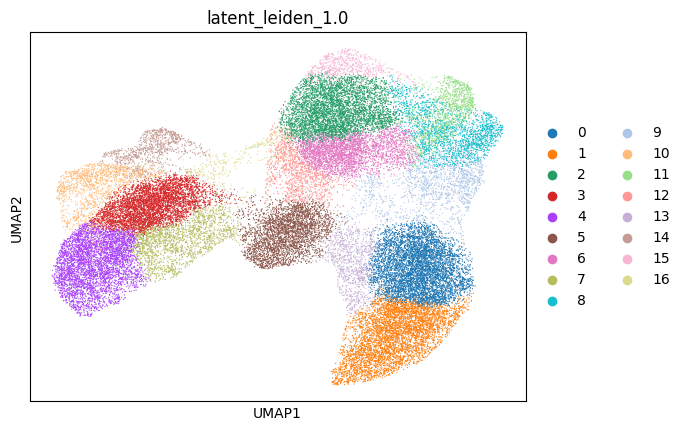

In [18]:
## cell distribution colored by original celltype
sc.pl.umap(model.adata, color=[latent_cluster_key], show=True, size=3)

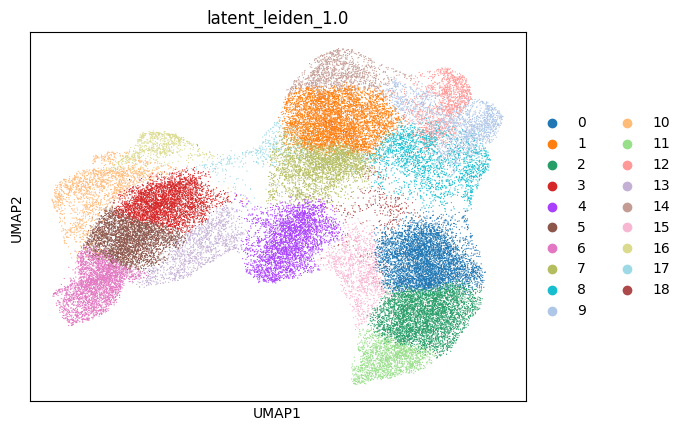

In [18]:
## cell distribution colored by original celltype
sc.pl.umap(model.adata, color=[latent_cluster_key], show=True, size=3)

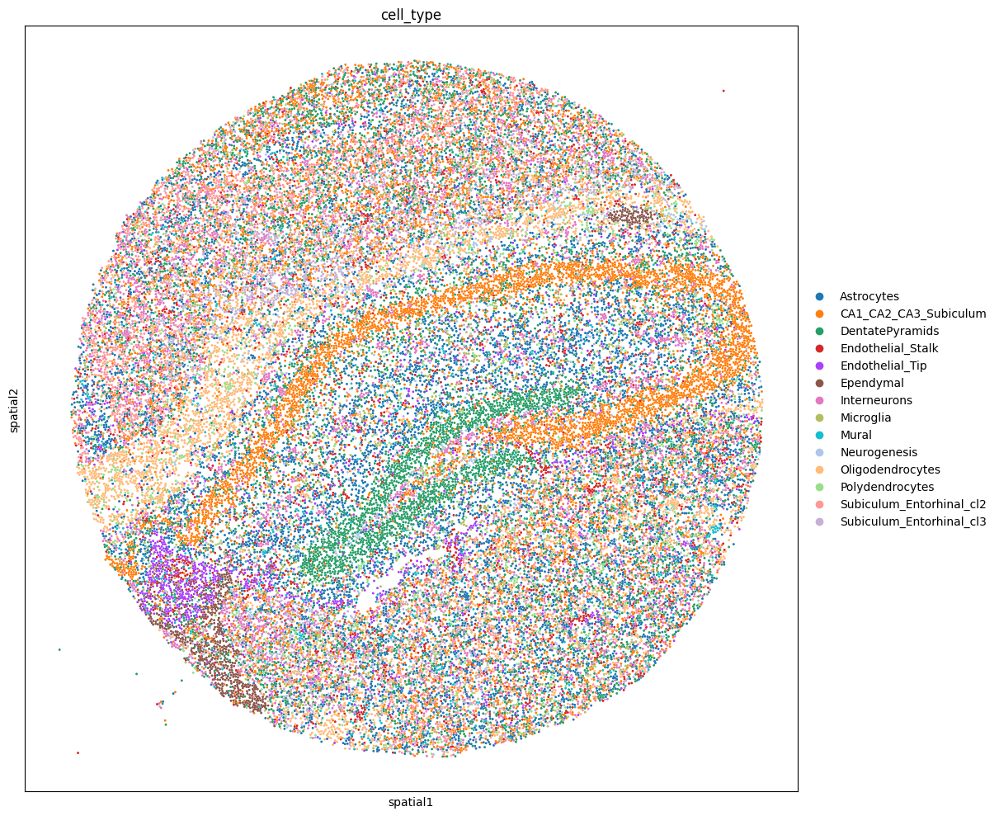

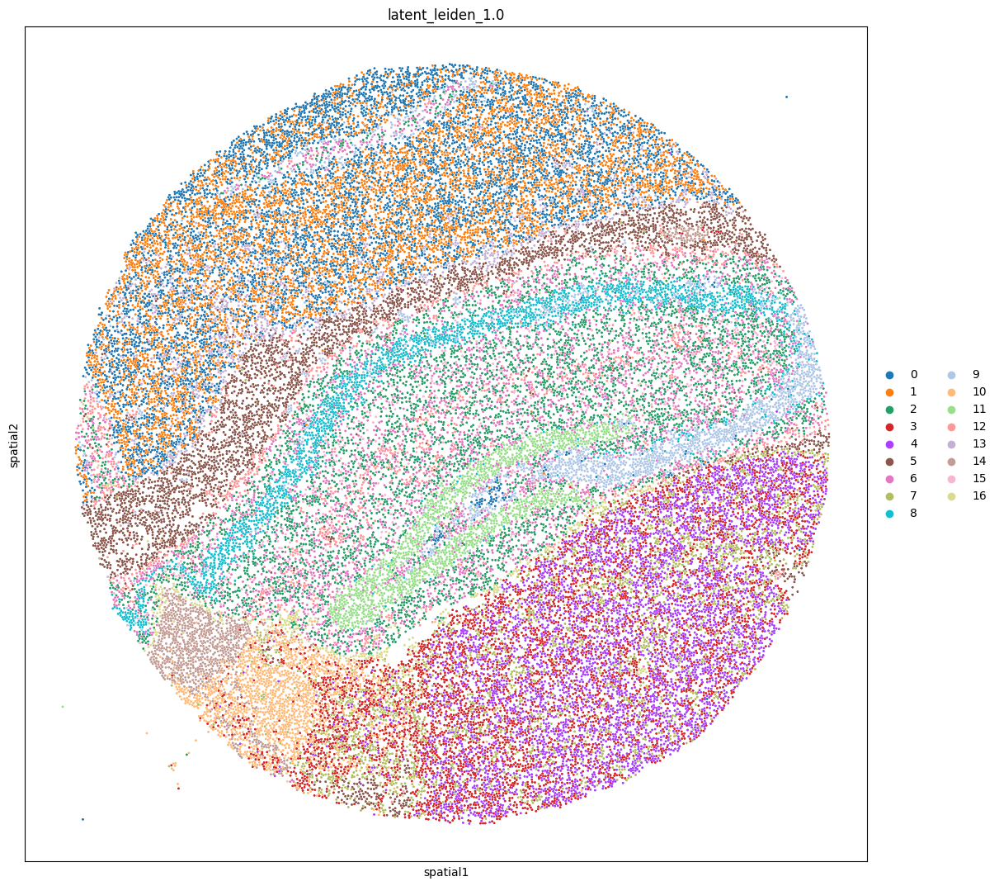

In [19]:
### 分样本展示空间位置
import squidpy as sq

# Visualize cell-level annotated data in physical space
## celltype 
sq.pl.spatial_scatter(model.adata, color='cell_type', shape=None, figsize=(12, 12))    

## niches
sq.pl.spatial_scatter(model.adata, color=latent_cluster_key, shape=None, figsize=(12, 12))     # 

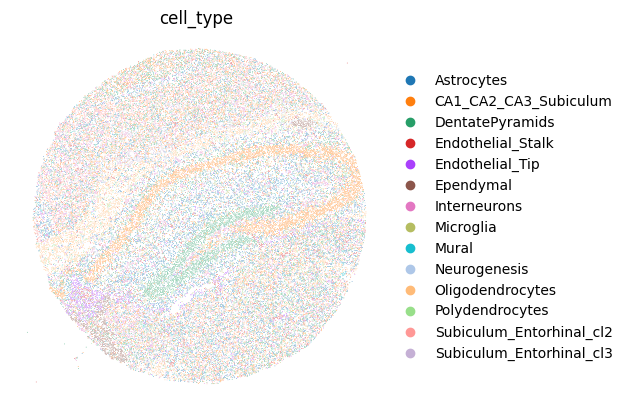

In [15]:
sc.pl.spatial(model.adata, color='cell_type', spot_size=10, frameon=False, title='cell_type')

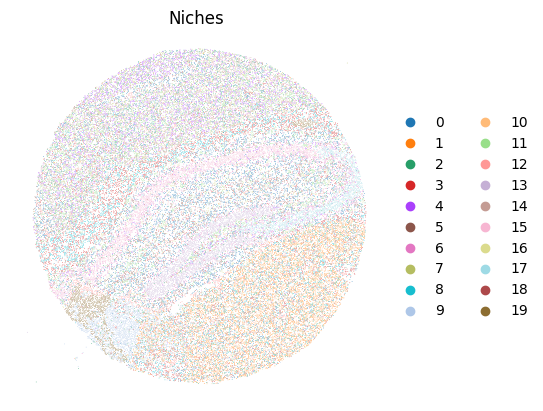

In [16]:
sc.pl.spatial(model.adata, color=latent_cluster_key, spot_size=10, frameon=False, title='Niches')

In [20]:
import numpy as np
import pandas as pd
from sklearn import metrics
import scanpy as sc
from sklearn.decomposition import PCA


def mclust_R(adata, num_cluster, modelNames='EEE', used_obsm='emb_pca', random_seed=2020):
    """\
    Clustering using the mclust algorithm.
    The parameters are the same as those in the R package mclust.
    """
    
    np.random.seed(random_seed)
    import rpy2.robjects as robjects
    robjects.r.library("mclust")

    import rpy2.robjects.numpy2ri
    rpy2.robjects.numpy2ri.activate()
    r_random_seed = robjects.r['set.seed']
    r_random_seed(random_seed)
    rmclust = robjects.r['Mclust']
    
    res = rmclust(rpy2.robjects.numpy2ri.numpy2rpy(adata.obsm[used_obsm]), num_cluster, modelNames)
    mclust_res = np.array(res[-2])

    adata.obs['mclust'] = mclust_res
    adata.obs['mclust'] = adata.obs['mclust'].astype('int')
    adata.obs['mclust'] = adata.obs['mclust'].astype('category')
    return adata

def clustering(adata, n_clusters=7, radius=50, key='emb', method='mclust', start=0.1, end=3.0, increment=0.01, refinement=False):
    """\
    Spatial clustering based the learned representation.

    Parameters
    ----------
    adata : anndata
        AnnData object of scanpy package.
    n_clusters : int, optional
        The number of clusters. The default is 7.
    radius : int, optional
        The number of neighbors considered during refinement. The default is 50.
    key : string, optional
        The key of the learned representation in adata.obsm. The default is 'emb'.
    method : string, optional
        The tool for clustering. Supported tools include 'mclust', 'leiden', and 'louvain'. The default is 'mclust'. 
    start : float
        The start value for searching. The default is 0.1.
    end : float 
        The end value for searching. The default is 3.0.
    increment : float
        The step size to increase. The default is 0.01.   
    refinement : bool, optional
        Refine the predicted labels or not. The default is False.

    Returns
    -------
    None.

    """
    
    pca = PCA(n_components=20, random_state=42) 
    embedding = pca.fit_transform(adata.obsm[key].copy())
    adata.obsm['emb_pca'] = embedding
    
    if method == 'mclust':
       adata = mclust_R(adata, used_obsm='emb_pca', num_cluster=n_clusters)
       adata.obs['domain'] = adata.obs['mclust']
    elif method == 'leiden':
       res = search_res(adata, n_clusters, use_rep='emb_pca', method=method, start=start, end=end, increment=increment)
       sc.tl.leiden(adata, random_state=0, resolution=res)
       adata.obs['domain'] = adata.obs['leiden']
    elif method == 'louvain':
       res = search_res(adata, n_clusters, use_rep='emb_pca', method=method, start=start, end=end, increment=increment)
       sc.tl.louvain(adata, random_state=0, resolution=res)
       adata.obs['domain'] = adata.obs['louvain'] 
       
    if refinement:  
       new_type = refine_label(adata, radius, key='domain')
       adata.obs['domain'] = new_type 
        
  
def search_res(adata, n_clusters, method='leiden', use_rep='emb', start=0.1, end=3.0, increment=0.01):
    '''\
    Searching corresponding resolution according to given cluster number
    
    Parameters
    ----------
    adata : anndata
        AnnData object of spatial data.
    n_clusters : int
        Targetting number of clusters.
    method : string
        Tool for clustering. Supported tools include 'leiden' and 'louvain'. The default is 'leiden'.    
    use_rep : string
        The indicated representation for clustering.
    start : float
        The start value for searching.
    end : float 
        The end value for searching.
    increment : float
        The step size to increase.
        
    Returns
    -------
    res : float
        Resolution.
        
    '''
    print('Searching resolution...')
    label = 0
    sc.pp.neighbors(adata, n_neighbors=50, use_rep=use_rep)
    for res in sorted(list(np.arange(start, end, increment)), reverse=True):
        if method == 'leiden':
           sc.tl.leiden(adata, random_state=0, resolution=res)
           count_unique = len(pd.DataFrame(adata.obs['leiden']).leiden.unique())
           print('resolution={}, cluster number={}'.format(res, count_unique))
        elif method == 'louvain':
           sc.tl.louvain(adata, random_state=0, resolution=res)
           count_unique = len(pd.DataFrame(adata.obs['louvain']).louvain.unique()) 
           print('resolution={}, cluster number={}'.format(res, count_unique))
        if count_unique == n_clusters:
            label = 1
            break

    assert label==1, "Resolution is not found. Please try bigger range or smaller step!." 
       
    return res    

In [21]:
tool = 'mclust' # mclust, leiden, and louvain

# clustering
n_clusters = 14
tool = 'mclust'
if tool == 'mclust':
   clustering(model.adata, n_clusters, method=tool, key='garfield_latent')
elif tool in ['leiden', 'louvain']:
   clustering(model.adata, n_clusters, method=tool, key='garfield_latent', start=0.1, end=2.0, increment=0.01)

   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.1.1
Type 'citation("mclust")' for citing this R package in publications.



fitting ...
  |======================================================================| 100%


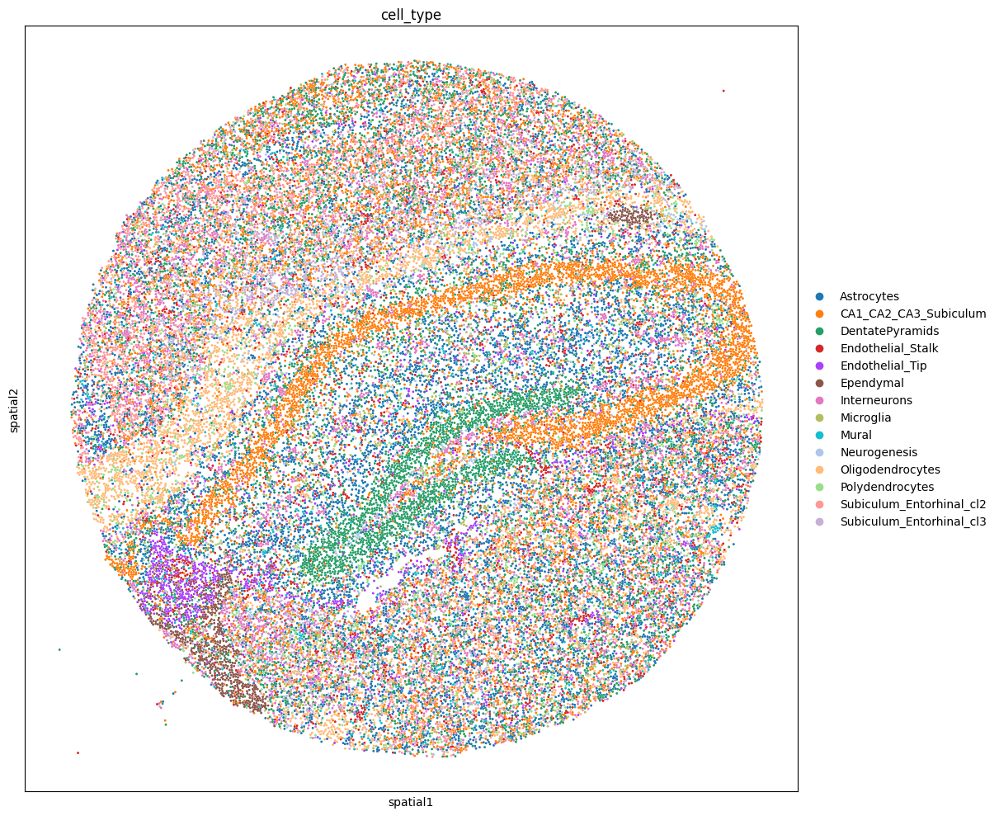

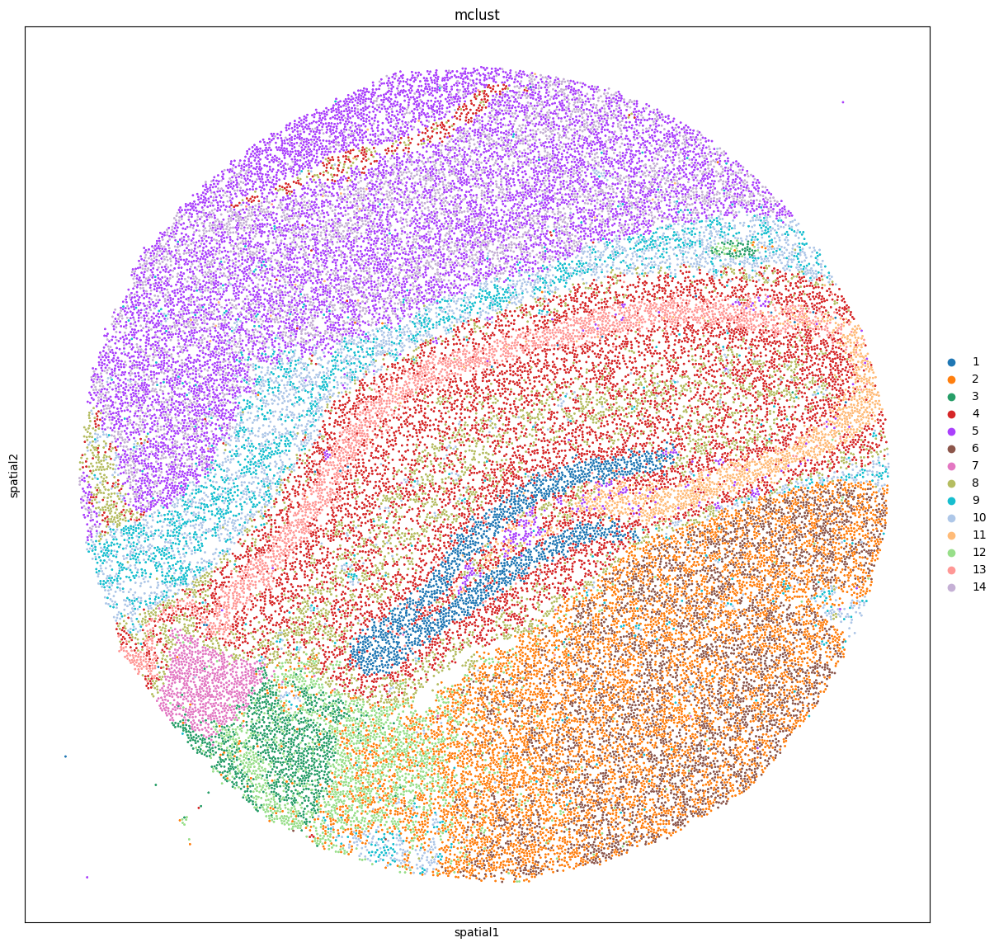

In [22]:
### 分样本展示空间位置
import squidpy as sq

# Visualize cell-level annotated data in physical space
## celltype 
sq.pl.spatial_scatter(model.adata, color='cell_type', shape=None, figsize=(12, 12))    

## niches
sq.pl.spatial_scatter(model.adata, color='mclust', shape=None, figsize=(12, 12))     # latent_cluster_key

In [ ]:
# Save trained model
model_folder_path = f"{workdir}/model"
os.makedirs(model_folder_path, exist_ok=True)

model.save(dir_path=model_folder_path,
           overwrite=True,
           save_adata=True,
           adata_file_name="adata_ref.h5ad")